In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import os
import tensorflow as tf
import tensorflow_hub as hub

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
import tensorflow_datasets as tfds

(ds_train, ds_test),info = tfds.load(
    name='beans',
    split=['train', 'test'],
    shuffle_files=True,
    as_supervised=True,  # This returns the data in (image, label) pairs
    with_info=True,
)

In [5]:
info

tfds.core.DatasetInfo(
    name='beans',
    full_name='beans/0.1.0',
    description="""
    Beans is a dataset of images of beans taken in the field using smartphone
    cameras. It consists of 3 classes: 2 disease classes and the healthy class.
    Diseases depicted include Angular Leaf Spot and Bean Rust. Data was annotated by
    experts from the National Crops Resources Research Institute (NaCRRI) in Uganda
    and collected by the Makerere AI research lab.
    """,
    homepage='https://github.com/AI-Lab-Makerere/ibean/',
    data_dir='C:\\Users\\monda\\tensorflow_datasets\\beans\\0.1.0',
    file_format=tfrecord,
    download_size=171.69 MiB,
    dataset_size=171.63 MiB,
    features=FeaturesDict({
        'image': Image(shape=(500, 500, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=3),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'test': <SplitInfo num_examples=128, num_shards=1>,
        '

In [6]:
# Function to convert a tf.data.Dataset to NumPy arrays in batch
def dataset_to_numpy(dataset, num_samples):
    images = []
    labels = []
    for image, label in tfds.as_numpy(dataset.take(num_samples)):
        images.append(image)
        labels.append(label)
    return np.array(images), np.array(labels)

# Convert the datasets to NumPy arrays
train_images, train_labels = dataset_to_numpy(ds_train,1034) # 1034 size of train data
test_images, test_labels = dataset_to_numpy(ds_test,128) # 128 size of test data

In [7]:
print(type(train_images))

<class 'numpy.ndarray'>


In [8]:
print(type(train_labels))

<class 'numpy.ndarray'>


In [9]:
# Verify the shapes of the arrays
print("Train images shape:", train_images.shape)
print("Train labels shape:", train_labels.shape)
print("Test images shape:", test_images.shape)
print("Test labels shape:", test_labels.shape)

Train images shape: (1034, 500, 500, 3)
Train labels shape: (1034,)
Test images shape: (128, 500, 500, 3)
Test labels shape: (128,)


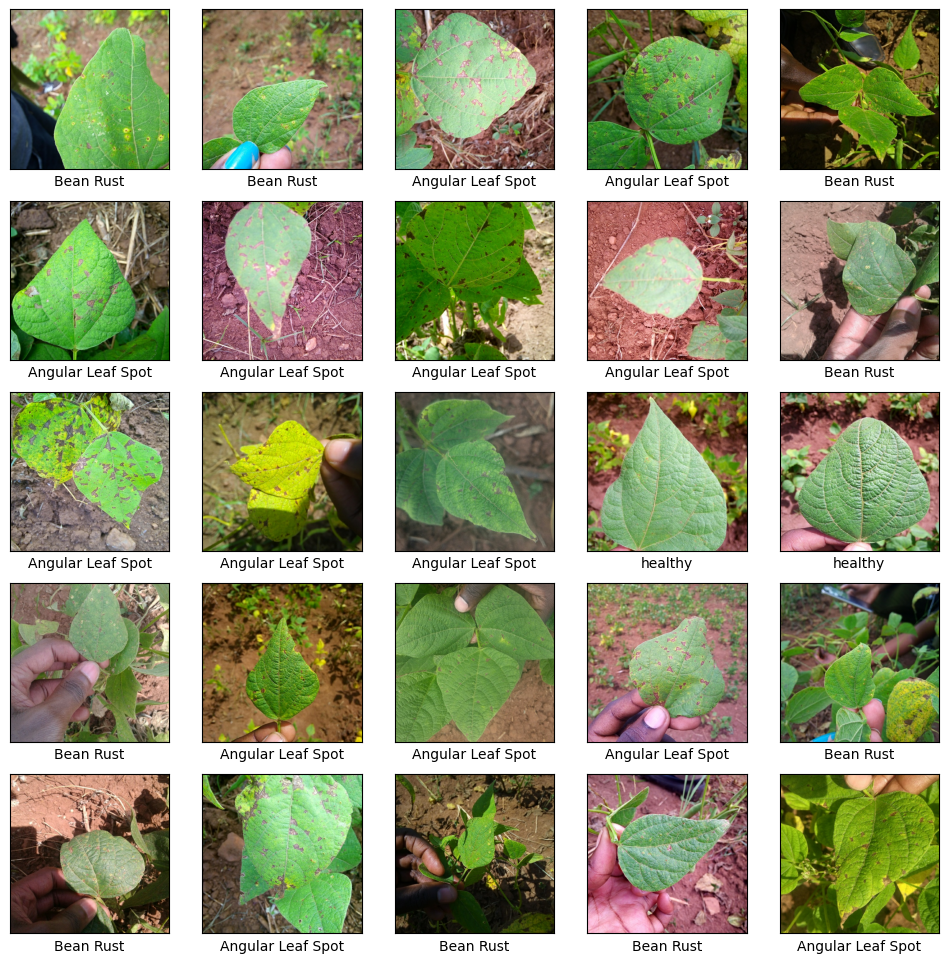

In [10]:
# print the first 25 images or datapoints

class_names = {0:'Angular Leaf Spot',1:'Bean Rust',2:'healthy'}
plt.figure(figsize=(12,12))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train_images[i])
    plt.xlabel(class_names[train_labels[i]])
plt.show()

# (i) Scaling or normalization

In [11]:
train_scaled_images=tf.image.resize(train_images,[64,64])
test_scaled_images=tf.image.resize(test_images,[64,64])

# (ii) Creating convolutional base (Convolution + Max Pooling)

In [12]:
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense 
from tensorflow.keras.layers import LeakyReLU,PReLU,ELU,ReLU
from tensorflow.keras.layers import Dropout 
import tensorflow

In [13]:
model = models.Sequential()

# input convolution layer (use 3 or 5 convolution layer in a CNN model 
model.add(layers.Conv2D(32, #this is the number of filters used in the layer (try to use no of filter in a multiply of input images shape here is 32,64,128...)
                        (3, 3), # size of the particular filter 
                        activation='relu', # activation function used because of backpropagation operation
                        input_shape=(64, 64, 3) # shape of the input image because of coloured image the 3D matrix (32*32*3) is used
                       )
         )
model.add(layers.MaxPooling2D((2, 2)))

# the hidden convolution layers 
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

In [14]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 62, 62, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 31, 31, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 29, 29, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 12, 12, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 6, 6, 128)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 93,248 (364.25 KB)

 Trainable params: 93,248 (364.25 KB)

 Non-trainable params: 0 (0.00 B)

# (iii) Flattening operation

In [15]:
# this is the input layer of the ann layer 
model.add(layers.Flatten())

In [16]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 62, 62, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 31, 31, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 29, 29, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 12, 12, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4608)           │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 93,248 (364.25 KB)

 Trainable params: 93,248 (364.25 KB)

 Non-trainable params: 0 (0.00 B)

# (iv) ANN to pass flattened datapoints

In [17]:
# add the first hidden layer 
model.add(Dense(units=100, # use no of hidden layer's node a multiple of the no of nodes in the input or flattened layer 
                activation='relu'
               )
         )
model.add(Dropout(0.3))

# add the second hidden layer 
model.add(Dense(units=50,activation='relu'))
model.add(Dropout(0.2))

# add the output layer 
model.add(Dense(3 # 3 is because of 3 classification output is there 
                  # activation='softmax' ; donot use any activation function in output layer  it decrease the accurecy if the loss function cannot able to find it 
                )
            )

In [18]:
# construct ANN with the hidden layers with the optimizer and loss funcion 
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [19]:
# Early Stopping concept 
import tensorflow as tf
early_stopping=tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0.001,
    patience=20,
    verbose=1,
    mode="auto",
    baseline=None,
    restore_best_weights=False,
    start_from_epoch=0,
)


In [20]:
history = model.fit(train_scaled_images, train_labels, epochs=100,validation_data=(test_scaled_images, test_labels),callbacks=early_stopping)

Epoch 1/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.3734 - loss: 8.9128 - val_accuracy: 0.6016 - val_loss: 0.9307
Epoch 2/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.5210 - loss: 0.9583 - val_accuracy: 0.6953 - val_loss: 0.8186
Epoch 3/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.6075 - loss: 0.8560 - val_accuracy: 0.6562 - val_loss: 0.7712
Epoch 4/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.6431 - loss: 0.8094 - val_accuracy: 0.7266 - val_loss: 0.7025
Epoch 5/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.7074 - loss: 0.6997 - val_accuracy: 0.6953 - val_loss: 0.6808
Epoch 6/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.6739 - loss: 0.6978 - val_accuracy: 0.7109 - val_loss: 0.6196
Epoch 7/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - accuracy: 0.7128 - loss: 0.6874 - val_accuracy: 0.7109 - val_loss: 0.6913
Epoch 8/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.6904 - loss: 0.6789 - val_accuracy: 0.

# (v) Model prediction and visualization

In [21]:
predictions=model.predict(test_scaled_images)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step 


In [22]:
test_loss, test_acc = model.evaluate(test_scaled_images,  test_labels, verbose=2)

4/4 - 0s - 15ms/step - accuracy: 0.7500 - loss: 0.8030


In [23]:
print(test_acc)

0.75


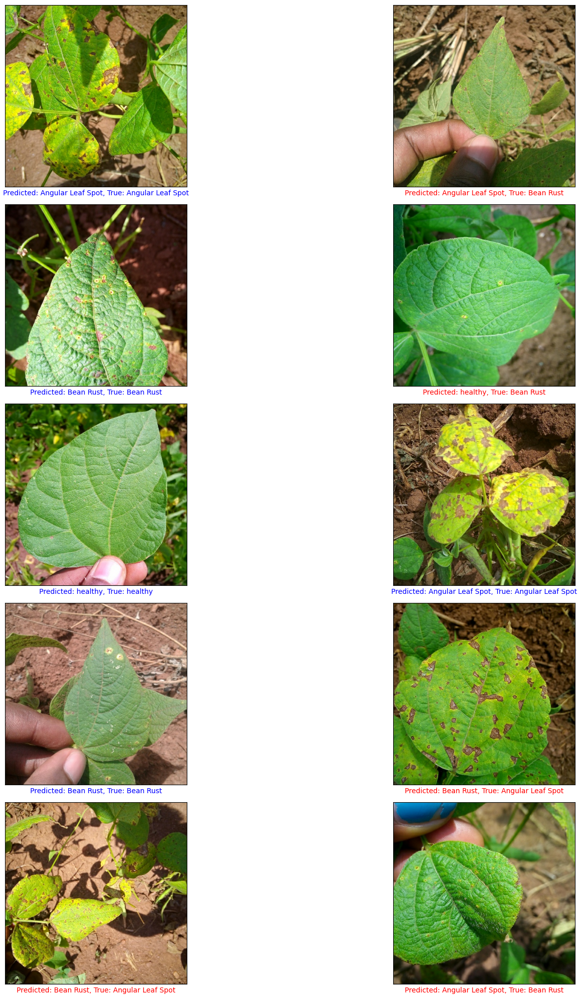

In [24]:
import numpy as np
import matplotlib.pyplot as plt

# Define a function to plot the images and their prediction values
class_names = {0:'Angular Leaf Spot',1:'Bean Rust',2:'healthy'}

def plot_image(i, predictions_array, true_labels, img):
    predictions_array, true_label, img = predictions_array[i], true_labels[i], img[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img)

    predicted_label = np.argmax(predictions_array)
    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel(f"Predicted: {class_names[predicted_label]}, True: {class_names[true_label]}", color=color)


plt.figure(figsize=(20,20))
for i in range(10):
    plt.subplot(5, 2, i+1)
    plot_image(i, predictions, test_labels, test_images)

plt.tight_layout()
plt.show()


# (vi) Transfer learning

In [25]:
from tensorflow.keras.layers import  GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

In [26]:
# Ensure the input shape matches your image data
input_shape = train_scaled_images.shape[1:]

# Load the MobileNetV2 model with pre-trained ImageNet weights
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze the base model
base_model.trainable = False


In [27]:
base_model.summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 32, 32,    │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 32, 32,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 32, 32,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 32, 32,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 32, 32,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 32, 32,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 32, 32,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 32, 32,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 32, 32,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 32, 32,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 32, 32,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 33, 33,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 16, 16,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 16, 16,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 16, 16,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 16, 16,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [28]:
# Create a new model on top 
model = Sequential([
    # The base model includes the convolutional layes 
    base_model,
    
    # inset the average Pooling in the model 
    GlobalAveragePooling2D(),
    
    # insert an ANN layer 
    Dense(128, activation='relu'),
    Dropout(0.3),
    
    # insert the output layer in the pretrained model 
    Dense(3, activation='softmax')
])

In [29]:
# Compile the newly made model 
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [30]:
# Early Stopping concept 
import tensorflow as tf
early_stopping=tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0.001,
    patience=20,
    verbose=1,
    mode="auto",
    baseline=None,
    restore_best_weights=False,
    start_from_epoch=0,
)


In [31]:
history = model.fit(train_scaled_images, train_labels, epochs=100,validation_data=(test_scaled_images, test_labels),callbacks=early_stopping)

Epoch 1/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - accuracy: 0.4756 - loss: 1.2957 - val_accuracy: 0.6406 - val_loss: 0.8910
Epoch 2/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - accuracy: 0.6004 - loss: 0.8926 - val_accuracy: 0.6484 - val_loss: 0.8269
Epoch 3/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - accuracy: 0.6259 - loss: 0.8262 - val_accuracy: 0.6641 - val_loss: 0.7732
Epoch 4/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.6702 - loss: 0.7420 - val_accuracy: 0.6875 - val_loss: 0.7608
Epoch 5/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.6955 - loss: 0.7080 - val_accuracy: 0.6719 - val_loss: 0.7735
Epoch 6/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - accuracy: 0.7055 - loss: 0.6923 - val_accuracy: 0.7031 - val_loss: 0.7283
Epoch 7/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - accuracy: 0.7265 - loss: 0.6420 - val_accuracy: 0.7031 - val_loss: 0.7202
Epoch 8/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - accuracy: 0.7737 - loss: 0.5965 - val_accuracy: 0

In [32]:
predictions=model.predict(test_scaled_images)

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step


In [33]:
test_loss, test_acc = model.evaluate(test_scaled_images,  test_labels, verbose=2)

4/4 - 0s - 41ms/step - accuracy: 0.6719 - loss: 0.9521


In [34]:
print(test_acc)

0.671875


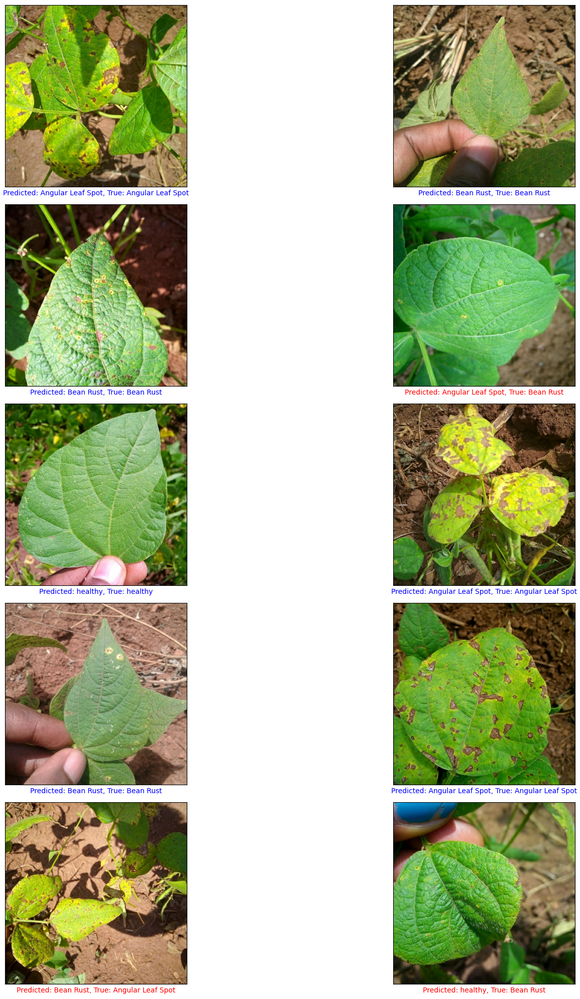

In [35]:
import numpy as np
import matplotlib.pyplot as plt

# Define a function to plot the images and their prediction values
class_names = {0:'Angular Leaf Spot',1:'Bean Rust',2:'healthy'}

def plot_image(i, predictions_array, true_labels, img):
    predictions_array, true_label, img = predictions_array[i], true_labels[i], img[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img)

    predicted_label = np.argmax(predictions_array)
    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel(f"Predicted: {class_names[predicted_label]}, True: {class_names[true_label]}", color=color)


plt.figure(figsize=(20,20))
for i in range(10):
    plt.subplot(5, 2, i+1)
    plot_image(i, predictions, test_labels, test_images)

plt.tight_layout()
plt.show()


# (vii) Make a prediction system

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


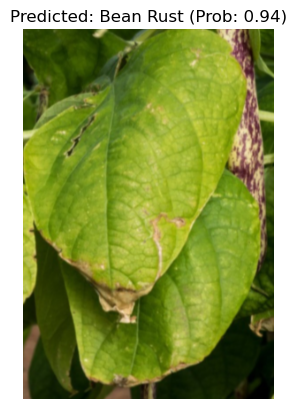

In [48]:
from tensorflow.keras.preprocessing import image

class_names = {0: 'Angular Leaf Spot', 1: 'Bean Rust', 2: 'Healthy'}

# Check the input image is a leaf image or not 
def is_leaf_image(img_array, threshold=0.1):
    avg_green_channel = np.mean(img_array[:,:,:,1])
    return avg_green_channel > threshold

# Predict the class for the image
def predict_image_class(img_array, model):
    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions[0])
    return predicted_class, predictions[0]

# vizualize the image and the prediction class
def visualize_image_with_prediction(img_path, predicted_class, prediction_probabilities):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.title(f"Predicted: {class_names[predicted_class]} (Prob: {prediction_probabilities[predicted_class]:.2f})")
    plt.axis('off')
    plt.show()
    
img_path='Prediction Image.png'
img=image.load_img(img_path, target_size=(500,500))
img_array = image.img_to_array(img)
img_array=tf.image.resize(img_array,[64,64])
img_array = np.expand_dims(img_array, axis=0)

if is_leaf_image(img_array):
    predicted_class, prediction_probabilities = predict_image_class(img_array, model)
    visualize_image_with_prediction(img_path, predicted_class, prediction_probabilities)
else:
    print("Uploaded image is not a leaf image. Please upload a correct image.")